<h1><center>Hammaad 2237928</center></h1>
<center>DE CW NOTEBOOK</center>

<h2>Web Scraping data for Air pollution</h2>

Getting latitude and longitude of each city

In [10]:
import requests

def get_lat_lon(api_key,city_name,limit=1):
    BASE_URL = "http://api.openweathermap.org/geo/1.0/direct"
    url = f"{BASE_URL}?q={city_name}&limit={limit}&appid={api_key}"
    response = requests.get(url).json()
    lat=response[0]['lat']
    lon=response[0]['lon']
    return lat,lon

api_key = "a1cffafa176a92a84c228d49cef0a38b"
city_name = "Colombo"


response = get_lat_lon(api_key, city_name,limit=1)
print(response)


(6.9387469, 79.8541134)


Getting Air pollution Values with AQI 

In [28]:
import requests

def get_airPollution(api_key, lat, lon):
    BASE_URL = "http://api.openweathermap.org/data/2.5/air_pollution/history?"
    url = f"{BASE_URL}lat={lat}&lon={lon}&start=1546281000&end=1704047400&appid={api_key}"
    response = requests.get(url).json()
    return response

api_key = "a1cffafa176a92a84c228d49cef0a38b"
cities = ["Colombo","Matara","Nuwara Eliya","Monaragala","Kurunegala","Jaffna","Kandy"]

data=[]
for city_name in cities:
    lat,lon = get_lat_lon(api_key, city_name,limit=1)
    response = get_airPollution(api_key, lat, lon)    
    col=['Date-time','City','co', 'no', 'no2', 'o3', 'so2', 'pm2_5', 'pm10','nh3','aqi']
    for i in response['list']:
        date=i['dt']
        current_date = datetime.utcfromtimestamp(date).strftime('%Y-%m-%d %H:%M:%S')
        i['dt']=current_date
        row=[i['dt'],city_name,i['components']['co'],i['components']['no'],i['components']['no2'],i['components']['o3'],i['components']['so2'],i['components']['pm2_5'],i['components']['pm10'],i['components']['nh3'],i['main']['aqi']]
        data.append(row)
        print(f"Scraped {city_name} data for {i['dt']}")
        
import pandas as pd
df=pd.DataFrame(data,columns=col)
df.to_csv('air_pollution.csv',index=False)


Scraped Colombo data for 2020-11-25 01:00:00
Scraped Colombo data for 2020-11-25 02:00:00
Scraped Colombo data for 2020-11-25 03:00:00
Scraped Colombo data for 2020-11-25 04:00:00
Scraped Colombo data for 2020-11-25 05:00:00
Scraped Colombo data for 2020-11-25 06:00:00
Scraped Colombo data for 2020-11-25 07:00:00
Scraped Colombo data for 2020-11-25 08:00:00
Scraped Colombo data for 2020-11-25 09:00:00
Scraped Colombo data for 2020-11-25 10:00:00
Scraped Colombo data for 2020-11-25 11:00:00
Scraped Colombo data for 2020-11-25 12:00:00
Scraped Colombo data for 2020-11-25 13:00:00
Scraped Colombo data for 2020-11-25 14:00:00
Scraped Colombo data for 2020-11-25 15:00:00
Scraped Colombo data for 2020-11-25 16:00:00
Scraped Colombo data for 2020-11-25 17:00:00
Scraped Colombo data for 2020-11-25 18:00:00
Scraped Colombo data for 2020-11-25 19:00:00
Scraped Colombo data for 2020-11-25 20:00:00
Scraped Colombo data for 2020-11-25 21:00:00
Scraped Colombo data for 2020-11-25 22:00:00
Scraped Co

Data only available from 2020 November onwards

<h2> Data Preprocessing </h2>

<h3>Data cleaning</h3>

Installing pyspark

In [1]:
pip install pyspark

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 317.0/317.0 MB 5.3 MB/s eta 0:00:0000:0100:02
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.5/200.5 kB 4.0 MB/s eta 0:00:00a 0:00:01
  Created wheel for pyspark: filename=pyspark-3.5.1-py2.py3-none-any.whl size=317488493 sha256=80ddbfe988f5416d5cc4cb4d38082bd3c77aa196bf4c727e6a628315b76d02d2
  Stored in directory: /Users/hammaad/Library/Caches/pip/wheels/95/13/41/f7f135ee114175605fb4f0a89e7389f3742aa6c1e1a5bcb657
Successfully built pyspark

[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


setting up the pyspark library

In [6]:
import pyspark
import pyspark.sql as pyspark_sql
from pyspark import SparkConf

sc = pyspark.SparkContext.getOrCreate()
spark = pyspark_sql.SparkSession(sc)


In [8]:
data = spark.read.csv("uncleaned data/HCHO_data/col_mat_nuw_output.csv", header=True, inferSchema=True)
data.show()

+----------------------+--------------+----------+----------+
|0.00019698343957810148|Colombo Proper|2019-01-01|2019-01-02|
+----------------------+--------------+----------+----------+
|  2.625522171968594...|Colombo Proper|2019-01-02|2019-01-03|
|  9.852118897938794E-5|Colombo Proper|2019-01-03|2019-01-04|
|  2.099320518114242E-4|Colombo Proper|2019-01-04|2019-01-05|
|  1.785337298892930...|Colombo Proper|2019-01-05|2019-01-06|
|  1.082296700235670...|Colombo Proper|2019-01-06|2019-01-07|
|  3.926829280477309...|Colombo Proper|2019-01-07|2019-01-08|
|  9.153156350685351E-5|Colombo Proper|2019-01-08|2019-01-09|
|  1.205978992853015...|Colombo Proper|2019-01-09|2019-01-10|
|  1.297723562983258...|Colombo Proper|2019-01-10|2019-01-11|
|  2.239188166801278...|Colombo Proper|2019-01-11|2019-01-12|
|  1.569418094178759...|Colombo Proper|2019-01-12|2019-01-13|
|                  NULL|Colombo Proper|2019-01-13|2019-01-14|
|  1.336291906862603...|Colombo Proper|2019-01-14|2019-01-15|
|  6.374

In [13]:
data = spark.read.csv("uncleaned data/HCHO_data/col_mat_nuw_output.csv", header=False, inferSchema=True)
cols = ["HCHO Reading", "Location", "Current Date", "Next Date"]
data = data.toDF(*cols)
data.show()

+--------------------+--------------+------------+----------+
|        HCHO Reading|      Location|Current Date| Next Date|
+--------------------+--------------+------------+----------+
|1.969834395781014...|Colombo Proper|  2019-01-01|2019-01-02|
|2.625522171968594...|Colombo Proper|  2019-01-02|2019-01-03|
|9.852118897938794E-5|Colombo Proper|  2019-01-03|2019-01-04|
|2.099320518114242E-4|Colombo Proper|  2019-01-04|2019-01-05|
|1.785337298892930...|Colombo Proper|  2019-01-05|2019-01-06|
|1.082296700235670...|Colombo Proper|  2019-01-06|2019-01-07|
|3.926829280477309...|Colombo Proper|  2019-01-07|2019-01-08|
|9.153156350685351E-5|Colombo Proper|  2019-01-08|2019-01-09|
|1.205978992853015...|Colombo Proper|  2019-01-09|2019-01-10|
|1.297723562983258...|Colombo Proper|  2019-01-10|2019-01-11|
|2.239188166801278...|Colombo Proper|  2019-01-11|2019-01-12|
|1.569418094178759...|Colombo Proper|  2019-01-12|2019-01-13|
|                NULL|Colombo Proper|  2019-01-13|2019-01-14|
|1.33629

Added column headers

In [19]:
data.printSchema()

root
 |-- HCHO Reading: double (nullable = true)
 |-- Location: string (nullable = true)
 |-- Current Date: date (nullable = true)
 |-- Next Date: date (nullable = true)



Check for missing values (Nan or empty)

In [39]:
from pyspark.sql.functions import col

total=0
for col_name in data.columns:
    total=total+data.filter(col(col_name).isNull()).count()
    print(col_name, data.filter(col(col_name).isNull()).count())

print("\nMissing values Proportion",total/data.count()*100)


HCHO Reading 2419
Location 0
Current Date 0
Next Date 0

Missing values Proportion 44.15845198977729


Need to figure out the trend to decide if we need to drop or fill the missing values, and ifso its method

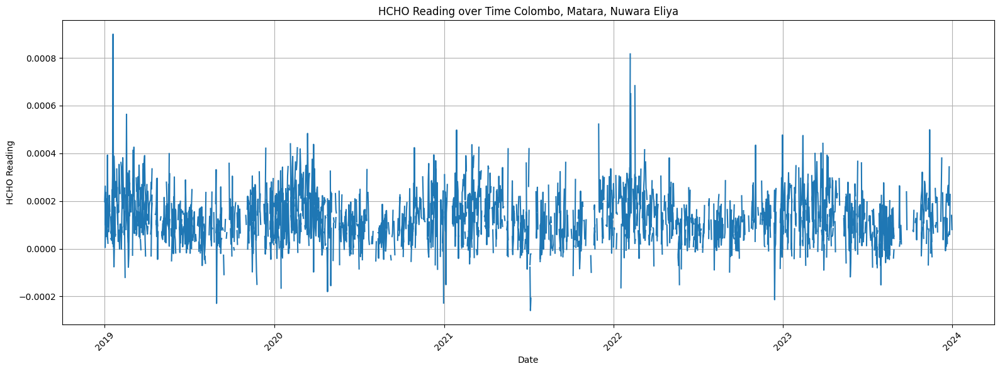

In [48]:
import matplotlib.pyplot as plt

plotting_data = data.select("Current Date", "HCHO Reading").toPandas()

plt.figure(figsize=(16, 6))
plt.plot(plotting_data["Current Date"], plotting_data["HCHO Reading"])
plt.title("HCHO Reading over Time Colombo, Matara, Nuwara Eliya")
plt.xlabel("Date")
plt.ylabel("HCHO Reading")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()

plt.show()


In [46]:
null_dates = data.filter(col("HCHO Reading").isNull()).select("Current Date").distinct()

print("Dates with null HCHO readings:")
null_dates.count()


Dates with null HCHO readings:


1290

We can see that there are 1290 different days where the servers were unable to read the data

In [47]:
dates = data.select("Current Date").distinct()

print("Dates with null HCHO readings:")
dates.count()


Dates with null HCHO readings:


1826

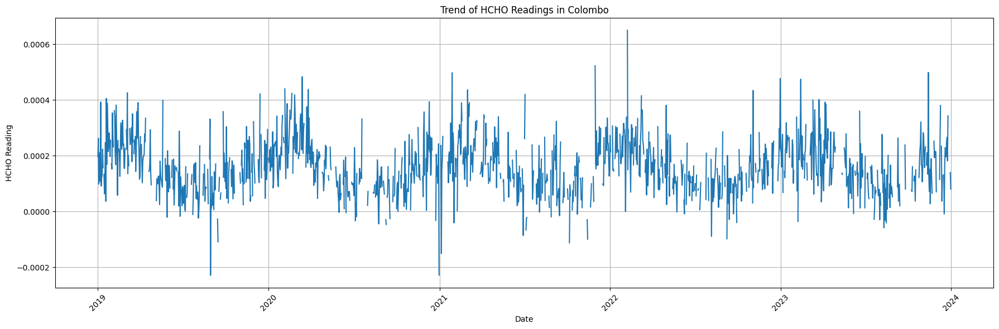

Missing values for Colombo:
+------------+--------------+------------+----------+
|HCHO Reading|      Location|Current Date| Next Date|
+------------+--------------+------------+----------+
|        NULL|Colombo Proper|  2019-01-13|2019-01-14|
|        NULL|Colombo Proper|  2019-01-29|2019-01-30|
|        NULL|Colombo Proper|  2019-02-04|2019-02-05|
|        NULL|Colombo Proper|  2019-02-14|2019-02-15|
|        NULL|Colombo Proper|  2019-03-01|2019-03-02|
|        NULL|Colombo Proper|  2019-03-02|2019-03-03|
|        NULL|Colombo Proper|  2019-03-09|2019-03-10|
|        NULL|Colombo Proper|  2019-03-18|2019-03-19|
|        NULL|Colombo Proper|  2019-03-21|2019-03-22|
|        NULL|Colombo Proper|  2019-04-03|2019-04-04|
|        NULL|Colombo Proper|  2019-04-14|2019-04-15|
|        NULL|Colombo Proper|  2019-04-15|2019-04-16|
|        NULL|Colombo Proper|  2019-04-16|2019-04-17|
|        NULL|Colombo Proper|  2019-04-17|2019-04-18|
|        NULL|Colombo Proper|  2019-04-19|2019-04-20|


In [69]:
colombo_data = data.filter(col("Location") == "Colombo Proper")

colombo_data_pandas = colombo_data.select("Current Date", "HCHO Reading").toPandas()

plt.figure(figsize=(18, 6))
plt.plot(colombo_data_pandas["Current Date"], colombo_data_pandas["HCHO Reading"])
plt.title("Trend of HCHO Readings in Colombo")
plt.xlabel("Date")
plt.ylabel("HCHO Reading")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

missing_values_colombo = colombo_data.filter(col("HCHO Reading").isNull())
print("Missing values for Colombo:")
missing_values_colombo.show()

we can see in colombo there is a trend, usually in the middel of the year the HCHO readings are quite lower and it begains to rise durin the third quarter of the year,lets see the details for each year 

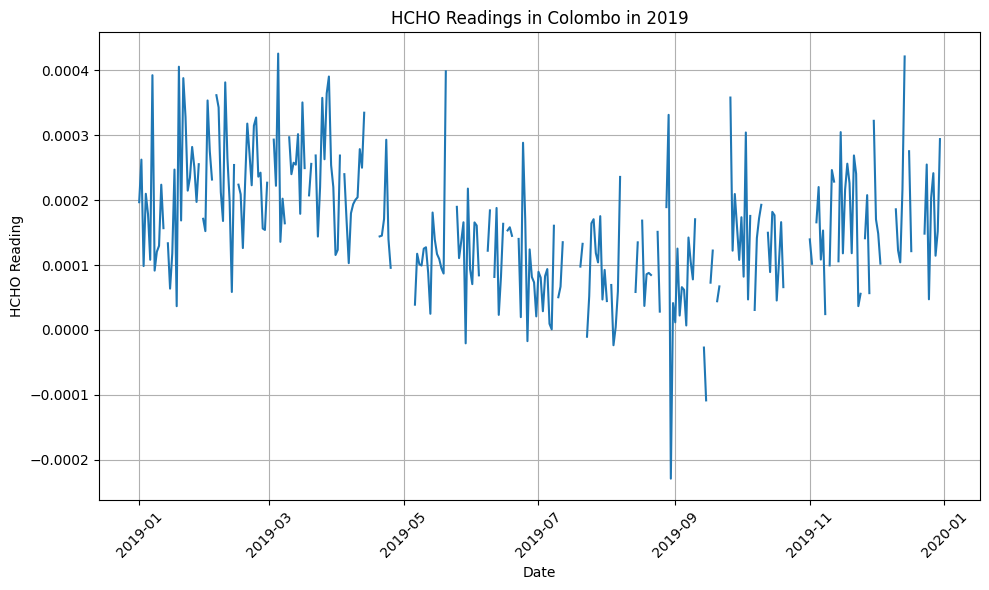

In [82]:
plt.figure(figsize=(10, 6))
plt.plot(colombo_2019_pandas["Current Date"], colombo_2019_pandas["HCHO Reading"])
plt.title("HCHO Readings in Colombo in 2019")
plt.xlabel("Date")
plt.ylabel("HCHO Reading")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()



Fill the missing values based on each location

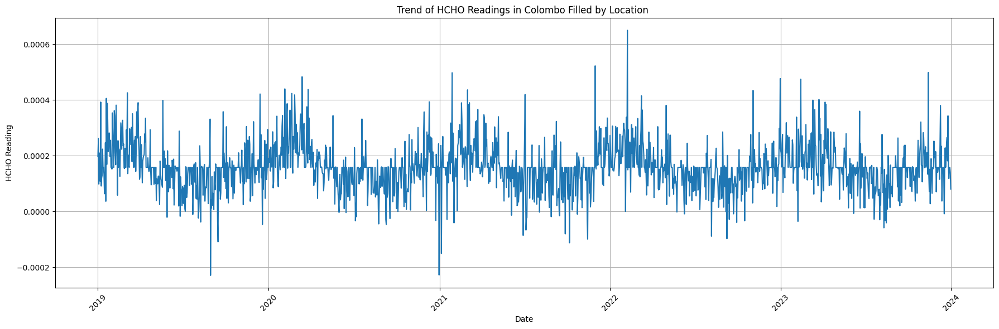

Missing values for Colombo:
+------------+--------+------------+---------+
|HCHO Reading|Location|Current Date|Next Date|
+------------+--------+------------+---------+
+------------+--------+------------+---------+



In [88]:
from pyspark.sql.functions import col, mean
colombo_data = data.filter(col("Location") == "Colombo Proper")

mean_hcho = colombo_data.select(mean("HCHO Reading")).collect()[0][0]
filled_data = colombo_data.fillna(mean_hcho, subset=["HCHO Reading"])

colombo_data_pandas = filled_data.select("Current Date", "HCHO Reading").toPandas()

plt.figure(figsize=(18, 6))
plt.plot(colombo_data_pandas["Current Date"], colombo_data_pandas["HCHO Reading"])
plt.title("Trend of HCHO Readings in Colombo Filled by Location ")
plt.xlabel("Date")
plt.ylabel("HCHO Reading")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

missing_values_colombo = filled_data.filter(col("HCHO Reading").isNull())
print("Missing values for Colombo:")
missing_values_colombo.show()

When we fill the values as a location it is accurate next steps would be to fill by each year then location